In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import requests
import datetime as dt
from warnings import simplefilter
from collections import Counter
import pickle
import nltk
nltk.download('stopwords')

simplefilter(action='ignore', category=FutureWarning)
%matplotlib inline

[nltk_data] Downloading package stopwords to /Users/Dubya/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


First we import the packages that may be of use while assembling the data.  Our goal in this notebook is to add a couple of features we think could be important and always revise more once we get to EDA.

We have collected six decades worth of data and the documentation for the various data sets can be found in the following links:

Songs by Decade: https://www.kaggle.com/theoverman/the-spotify-hit-predictor-dataset?select=dataset-of-10s.csv

Genre Artist Data: https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=tracks.csv

Explicity Tag/Release Date: https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks?select=data_o.csv


While I could make the argument for focusing our data and analysis on the most recent decades to predict hits for a modern audience, I like the idea of including the noise of past generations of music.  Plus modern day artists can be successful with "throwback" sounds (i.e. the Weeknd and Burno Mars. For EDA it will be good to see how things have changed through time, if at all whether it be general style or the make up of a hit.  Please look at the excel work book (in this directory) for mean feature change visual with associated mean table below.

We are brining in a second data assmebled by a different user to get more information from spotify including artist followers on the platfom, genres and spotify's popularity metric.  

The actual year/date of release and the explicit/not explicity content for some of these track is also available but does not overlap perfectly with the dataset that we are building (lose about a third of the data).  We will save these two items year and explicit label for additional feature addition if required, but with decade already modeled year feels less important.  As for explicit label while I expect that to grow both in songs and hits over time due to changing cultural standards, my initial intuition is this won't be a heavy factor but we can always use later if we think it will help (modern area is more explicit and that is what were most interested in).  At least not heavy enough to warrant losing 33% of the data.

In [2]:
#Bring in Decades of Music
sixties = pd.read_csv('Data/dataset-of-60s.csv')
seventies = pd.read_csv('Data/dataset-of-70s.csv')
eighties = pd.read_csv('Data/dataset-of-80s.csv')
nineties = pd.read_csv('Data/dataset-of-90s.csv')
naughts = pd.read_csv('Data/dataset-of-00s.csv')
tens = pd.read_csv('Data/dataset-of-10s.csv')
#Bring in artist genre, followers and popularity
artist_data = pd.read_csv('Data/artists.csv')
#bring in year release and explicit tag
date_explicit = pd.read_csv('Data/data_2.csv')

Add decade tag before we put all data togeher

In [3]:
sixties['decade'] = 1960
seventies['decade'] = 1970
eighties['decade'] = 1980
nineties['decade'] = 1990
naughts['decade'] = 2000
tens['decade'] = 2010


print("60s song number: {}".format(len(sixties)))
print("70s song number: {}".format(len(seventies)))
print("80s song number: {}".format(len(eighties)))
print("90s song number: {}".format(len(nineties)))
print("00s song number: {}".format(len(naughts)))
print("10s song number: {}".format(len(tens)))

print()
print("60s unique artist: {}".format(len(sixties['artist'].unique())))
print("70s unique artist: {}".format(len(seventies['artist'].unique())))
print("80s unique artist: {}".format(len(eighties['artist'].unique())))
print("90s unique artist: {}".format(len(nineties['artist'].unique())))
print("00s unique artist: {}".format(len(naughts['artist'].unique())))
print("10s unique artist: {}".format(len(tens['artist'].unique())))

60s song number: 8642
70s song number: 7766
80s song number: 6908
90s song number: 5520
00s song number: 5872
10s song number: 6398

60s unique artist: 1542
70s unique artist: 1837
80s unique artist: 2021
90s unique artist: 2476
00s unique artist: 2920
10s unique artist: 3355


In terms of total number of rows per decade we are fairly consitent in the 6-8k region, though the earlier decades appear to have more scraped data then the last forty years

In [4]:
print("60s: {:.2f}".format(len(sixties['artist'].unique()) / len(sixties['uri'].unique())))
print("70s: {:.2f}".format(len(seventies['artist'].unique()) / len(seventies['uri'].unique())))
print("80s: {:.2f}".format(len(eighties['artist'].unique()) / len(eighties['uri'].unique())))
print("90s: {:.2f}".format(len(nineties['artist'].unique()) / len(nineties['uri'].unique())))
print("00s: {:.2f}".format(len(tens['artist'].unique()) / len(naughts['uri'].unique())))
print("10s: {:.2f}".format(len(tens['artist'].unique()) / len(tens['uri'].unique())))

60s: 0.18
70s: 0.24
80s: 0.29
90s: 0.45
00s: 0.57
10s: 0.53


Whether or not its actually true would need to be further looked at, but in terms of the data sets we have the number of artists per unique song is rising over time.  

As part of our EDA it will be good too look into share of responsible hits per artist per decade.  

One last thing before we look at combining these data sets and preparing to merge in artist info.

In [5]:
print("60s w Featuring in Artist: {}".format((sixties.artist.str.count("Featuring").sum())))
print("70s w Featuring in Artist: {}".format((seventies.artist.str.count("Featuring").sum())))
print("80s w Featuring in Artist: {}".format((eighties.artist.str.count("Featuring").sum())))
print("90s w Featuring in Artist: {}".format((nineties.artist.str.count("Featuring").sum())))
print("00s w Featuring in Artist: {}".format((naughts.artist.str.count("Featuring").sum())))
print("10s w Featuring in Artist: {}".format((tens.artist.str.count("Featuring").sum())))

60s w Featuring in Artist: 0
70s w Featuring in Artist: 18
80s w Featuring in Artist: 26
90s w Featuring in Artist: 151
00s w Featuring in Artist: 557
10s w Featuring in Artist: 900


Featuring aritsts has become more prevelant in recent years and/or the labeling/crediting within the industry has changed through time.  While this in itself is interesting because of the internet and collaboration being easier and/or just a change in artist working together more, we are more concerned with merging the artist name with our other data set.  This also could be part of the explanation for more "unique" artist that we saw above as each unique combination of artist featured will inflate the newer music vs the older

With the spotify API, the track level info will have artist featuring other artist, but the "main" artist who's the title/album credit will not include this when looking for unique ID for artist in the spotify API.

Therefore if we chop off the featuing aspect we will have more records to match the unique artist and other items we want from the other database like genre which is tagged to artist name (roughly 2,000 more artist tracks will be able to be classified because of this).

By just giving the credit to the main artist we are losing something (perhaps a featuring artist is part of the success) but we would also be eliminating more songs and/or losing genre context,

Let's take a look at what our current data set looks like

In [65]:
# Look at the last decade
tens

,track,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,target,decade,prev_hits,hiphop,pop,rock,techno,jazz,soul_blues,genre_class
34708,Wild Things,Alessia Cara,0.741,0.626,1,-4.826,0,0.0886,0.02000,0.000000,...,1,2010,0,1,1,0,1,0,0,Other
34709,Surfboard,Esquivel!,0.447,0.247,5,-14.661,0,0.0346,0.87100,0.814000,...,0,2010,0,0,1,0,0,0,0,Pop
34710,Love Someone,Lukas Graham,0.550,0.415,9,-6.557,0,0.0520,0.16100,0.000000,...,1,2010,0,0,1,0,0,0,0,Pop
34711,Music To My Ears (feat. Tory Lanez),Keys N Krates,0.502,0.648,0,-5.698,0,0.0527,0.00513,0.000000,...,0,2010,0,1,0,0,1,0,0,Techno
34712,Juju On That Beat (TZ Anthem),Zay Hilfigerrr & Zayion McCall,0.807,0.887,1,-3.892,1,0.2750,0.00381,0.000000,...,1,2010,0,1,1,1,1,1,1,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,0.172,0.358,9,-14.430,1,0.0342,0.88600,0.966000,...,0,2010,0,0,0,0,0,0,0,Other
41102,Calling My Spirit,Kodak Black,0.910,0.366,1,-9.954,1,0.0941,0.09960,0.000000,...,1,2010,8,1,0,0,0,0,0,Hip_Hop_RB
41103,Teenage Dream,Katy Perry,0.719,0.804,10,-4.581,1,0.0355,0.01320,0.000003,...,1,2010,21,0,1,0,0,0,0,Pop
41104,Stormy Weather,Oscar Peterson,0.600,0.177,7,-16.070,1,0.0561,0.98900,0.868000,...,0,2010,0,0,0,0,0,1,0,Jazz


We have about 15 features to start with and now a decade tag added as well.

Our target variable is whether a song was a hit (1) or a flop (0).  Full definition given below per the dataset author.

* Target: The target variable for the track. It can be either '0' or '1'. '1' implies that this song has featured in the weekly list (Issued by Billboards) of Hot-100 tracks in that decade at least once and is therefore a 'hit'. '0' Implies that the track is a 'flop'. *

In [7]:
all_df = [sixties,seventies,eighties,nineties,naughts,tens]
total_df = pd.concat(all_df ).reset_index(drop=True)

In [8]:
total_df

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,0.000000,0.0779,0.8450,185.655,173533,3,32.94975,9,1,1960
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.0180,0.107000,0.1760,0.7970,101.801,213613,4,48.82510,10,0,1960
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,0.000004,0.1190,0.9080,115.940,223960,4,37.22663,12,0,1960
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,0.024600,0.0610,0.9670,105.592,157907,4,24.75484,8,0,1960
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,0.000872,0.2130,0.9060,114.617,245600,4,21.79874,14,0,1960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,0.966000,0.3140,0.0361,72.272,150857,4,24.30824,7,0,2010
41102,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.0996,0.000000,0.2610,0.7400,119.985,152000,4,32.53856,8,1,2010
41103,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.0132,0.000003,0.1390,0.6050,119.999,227760,4,20.73371,7,1,2010
41104,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,0.868000,0.1490,0.5600,120.030,213387,4,21.65301,14,0,2010


We will now take out featuring from our artists and keep the first record

In [9]:
total_df['artist'] = total_df['artist'].str.split(' Featuring').str[0]
total_df['artist'] = total_df['artist'].str.split('\(Featuring').str[0]
total_df['artist'] = total_df['artist'].str.split(' featuring').str[0]
total_df['artist'] = total_df['artist'].str.split('.Feat').str[0]
total_df['artist'] = total_df['artist'].str.split('feat.').str[0]

Next we create a feature to try and incorporate brand value.  We will look in the data set and for each artist song check whether that artist tagged to the song has had a prior hit.  This will allow us to consider whether an artist' momentum of prior success can play a part. 

Again we will most likely be looking at the 80s and beyond once we get into modeling, but its still good to consider and building this feature from the 60s and beyond to build up the history for artists that span decades (i.e. the Beatles or Michael Jackson).

This metric isn't perfect as our data set doesn't incorporate times an artist has been featured on other tracks or is buried within a band/group (i.e. Michael Jackson was in Jackson 5 before going solo). 

In [10]:
total_df['prev_hits'] = total_df.groupby(['artist'])['target'].apply(lambda x: x.cumsum())

Double check looking at Katy Pertty that the values are being added up right

In [11]:
total_df[total_df['artist']=="Katy Perry"]

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade,prev_hits
29302,Hot N Cold,Katy Perry,spotify:track:1y4eb6hmAvsqlDOl3fx9kk,0.706,0.841,7,-3.956,1,0.0418,0.000079,...,0.0688,0.861,132.032,220227,4,125.52983,5,1,2000,1
30788,I Kissed A Girl,Katy Perry,spotify:track:005lwxGU1tms6HGELIcUv9,0.699,0.760,5,-3.173,1,0.0677,0.002230,...,0.1320,0.696,129.996,179640,4,31.50965,7,1,2000,2
31038,Waking Up In Vegas,Katy Perry,spotify:track:6fvxos1qSHrIgOkKw4dhWS,0.524,0.878,5,-3.108,0,0.0346,0.001200,...,0.0980,0.590,130.989,199187,4,31.67120,10,1,2000,3
32328,Thinking Of You,Katy Perry,spotify:track:3c9LVPh3MpeFoaAL5DBDK5,0.431,0.803,4,-4.459,1,0.0364,0.001670,...,0.3310,0.309,147.048,246410,4,26.26383,13,1,2000,4
34740,Swish Swish,Katy Perry,spotify:track:3OtMnyUaiipcAT23A8liyi,0.839,0.705,5,-5.194,0,0.0445,0.018400,...,0.1020,0.575,119.954,242520,4,25.02456,11,1,2010,5
34941,Part Of Me,Katy Perry,spotify:track:1nZzRJbFvCEct3uzu04ZoL,0.678,0.918,5,-4.630,1,0.0355,0.000417,...,0.0744,0.769,130.028,216160,4,26.46808,12,1,2010,6
35025,Unconditionally,Katy Perry,spotify:track:4fwbGKNExPtPHbor1TBSY4,0.397,0.725,7,-4.862,1,0.0430,0.002660,...,0.2080,0.358,128.861,228879,4,36.26399,8,1,2010,7
35519,E.T.,Katy Perry,spotify:track:36ux3YuUsGTWPT8fXclS45,0.620,0.869,1,-5.252,1,0.1750,0.018100,...,0.3690,0.760,151.684,229573,4,33.74530,11,1,2010,8
36666,Birthday,Katy Perry,spotify:track:2xLOMHjkOK8nzxJ4r6yOKR,0.719,0.674,11,-5.122,1,0.0681,0.087900,...,0.1120,0.843,125.980,215042,4,26.53974,9,1,2010,9
36687,California Gurls,Katy Perry,spotify:track:6tS3XVuOyu10897O3ae7bi,0.791,0.754,0,-3.729,1,0.0569,0.004460,...,0.1630,0.425,125.014,234653,4,19.31478,9,1,2010,10


It looks like its counting the first song as 1 as opposed to 0 previous hits, so let's update so the first record shows 0 previous hits

In [12]:
total_df['prev_hits']= total_df['prev_hits'].apply(lambda x: x-1 if x>0 else 0)

In [13]:
total_df[total_df['artist']=="Katy Perry"]

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade,prev_hits
29302,Hot N Cold,Katy Perry,spotify:track:1y4eb6hmAvsqlDOl3fx9kk,0.706,0.841,7,-3.956,1,0.0418,0.000079,...,0.0688,0.861,132.032,220227,4,125.52983,5,1,2000,0
30788,I Kissed A Girl,Katy Perry,spotify:track:005lwxGU1tms6HGELIcUv9,0.699,0.760,5,-3.173,1,0.0677,0.002230,...,0.1320,0.696,129.996,179640,4,31.50965,7,1,2000,1
31038,Waking Up In Vegas,Katy Perry,spotify:track:6fvxos1qSHrIgOkKw4dhWS,0.524,0.878,5,-3.108,0,0.0346,0.001200,...,0.0980,0.590,130.989,199187,4,31.67120,10,1,2000,2
32328,Thinking Of You,Katy Perry,spotify:track:3c9LVPh3MpeFoaAL5DBDK5,0.431,0.803,4,-4.459,1,0.0364,0.001670,...,0.3310,0.309,147.048,246410,4,26.26383,13,1,2000,3
34740,Swish Swish,Katy Perry,spotify:track:3OtMnyUaiipcAT23A8liyi,0.839,0.705,5,-5.194,0,0.0445,0.018400,...,0.1020,0.575,119.954,242520,4,25.02456,11,1,2010,4
34941,Part Of Me,Katy Perry,spotify:track:1nZzRJbFvCEct3uzu04ZoL,0.678,0.918,5,-4.630,1,0.0355,0.000417,...,0.0744,0.769,130.028,216160,4,26.46808,12,1,2010,5
35025,Unconditionally,Katy Perry,spotify:track:4fwbGKNExPtPHbor1TBSY4,0.397,0.725,7,-4.862,1,0.0430,0.002660,...,0.2080,0.358,128.861,228879,4,36.26399,8,1,2010,6
35519,E.T.,Katy Perry,spotify:track:36ux3YuUsGTWPT8fXclS45,0.620,0.869,1,-5.252,1,0.1750,0.018100,...,0.3690,0.760,151.684,229573,4,33.74530,11,1,2010,7
36666,Birthday,Katy Perry,spotify:track:2xLOMHjkOK8nzxJ4r6yOKR,0.719,0.674,11,-5.122,1,0.0681,0.087900,...,0.1120,0.843,125.980,215042,4,26.53974,9,1,2010,8
36687,California Gurls,Katy Perry,spotify:track:6tS3XVuOyu10897O3ae7bi,0.791,0.754,0,-3.729,1,0.0569,0.004460,...,0.1630,0.425,125.014,234653,4,19.31478,9,1,2010,9


Perfect now the first record shows 0 previous hits, lets take a look at the top artists with the most hits in this database.

Drake has the most hits in this database along with the Glee Cast and the Beatles.

In [14]:
total_df.sort_values(by=['prev_hits'],ascending=False).head(25)

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target,decade,prev_hits
41000,Behind Barz,Drake,spotify:track:5r7WvQtyPfy1xch5zMgGRp,0.854,0.554,8,-4.684,1,0.1720,0.76900,...,0.0749,0.272,142.069,163121,4,43.53783,6,1,2010,79
40998,Ice Melts,Drake,spotify:track:7bJ4mu7MHa3rHiNyKjOoSl,0.813,0.551,6,-7.605,0,0.3530,0.08000,...,0.3860,0.598,124.957,250770,4,46.13365,9,1,2010,78
40978,Hype,Drake,spotify:track:5NFYuqu8V6QXc6mzcLImd6,0.787,0.635,4,-8.282,0,0.1530,0.02550,...,0.3560,0.238,130.014,209413,4,23.79898,13,1,2010,77
40663,0 To 100 / The Catch Up,Drake,spotify:track:4jtyUzZm9WLc2AdaJ1dso7,0.559,0.716,11,-3.964,0,0.3900,0.73700,...,0.2520,0.504,176.618,275227,4,22.04710,14,1,2010,76
40635,Miss Me,Drake,spotify:track:1U4mweNwisxNj23ffuC9gO,0.426,0.862,2,-5.979,1,0.5970,0.08130,...,0.3400,0.332,100.300,305520,5,66.94832,12,1,2010,75
40521,Take Care,Drake,spotify:track:047fCsbO4NdmwCBn8pcUXl,0.492,0.260,9,-17.341,0,0.0921,0.64600,...,0.0705,0.312,111.519,347227,5,28.64767,11,1,2010,74
40460,Nonstop,Drake,spotify:track:0TlLq3lA83rQOYtrqBqSct,0.912,0.412,7,-8.074,1,0.1240,0.01640,...,0.1040,0.422,154.983,238614,4,24.01108,11,1,2010,73
40455,Mob Ties,Drake,spotify:track:7rC5Pl8rQSX4myONQHYPBK,0.755,0.575,4,-8.393,0,0.0678,0.04560,...,0.2760,0.490,85.987,205147,4,24.07639,11,1,2010,72
40360,Started From The Bottom,Drake,spotify:track:5DI9jxTHrEiFAhStG7VA8E,0.794,0.522,8,-7.829,1,0.1590,0.03280,...,0.1560,0.567,86.318,174133,4,45.93537,7,1,2010,71
40219,Find Your Love,Drake,spotify:track:4BycRneKmOs6MhYG9THsuX,0.627,0.614,6,-6.006,0,0.1700,0.02110,...,0.0286,0.758,96.038,208947,4,50.83887,7,1,2010,70


Time to look at are other data set that has the key information of genre, followers and popularity as determined by Spotify.

Again this data is not perfect as many artists have blank genres while others may have as many as five or six different genre classifications. 

The popularity and followers are also snap shots of the artists popularity measured fairly recently, so this data is skewed towards today which is good in that we want to sell music today, but does lose some of the historical context specific to the period (i.e. Band A was huge by 60s standards but is less appreciated today).

In [15]:
artist_data

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0
...,...,...,...,...,...
1104344,6rJIG42vcWAf1UBdRFlQxB,3345.0,[],Cody Longo,8
1104345,1ljurfXKPlGncNdW3J8zJ8,2123.0,['deep acoustic pop'],Right the Stars,18
1104346,2vnT9YhKIvjVo9LnVjWmr2,26.0,[],Jesse Giddings,0
1104347,3ID0E5XCvnJIYZEq043ZoB,406.0,[],The Boy Band Project,0


We are looking at potential hits, so we will probably be interested in artist that are fairly well known.  It is possible that super small artists that happen to share the name of larger artist could have made a hit, but unlikely it would have less followers. 

So we will remove the duplicate artist name from the artist database before merging with the hits database

In [16]:
artist = artist_data.sort_values(by='followers', ascending=False)
artist = artist.drop_duplicates(subset='name', keep="first")

In [17]:
artist

,id,followers,genres,name,popularity
144138,6eUKZXaKkcviH0Ku9w2n3V,78900234.0,"['pop', 'uk pop']",Ed Sheeran,92
144485,66CXWjxzNUsdJxJ2JdwvnR,61301006.0,"['pop', 'post-teen pop']",Ariana Grande,95
313676,3TVXtAsR1Inumwj472S9r4,54416812.0,"['canadian hip hop', 'canadian pop', 'hip hop'...",Drake,98
144481,1uNFoZAHBGtllmzznpCI3s,44606973.0,"['canadian pop', 'pop', 'post-teen pop']",Justin Bieber,100
144488,7dGJo4pcD2V6oG8kP0tJRR,43747833.0,"['detroit hip hop', 'hip hop', 'rap']",Eminem,94
...,...,...,...,...,...
468526,6jkpqSWWsXSuqtsoeAiMDU,NaN,['uk americana'],Police Dog Hogan,14
468527,7aMdHPv79qOuqqBD6TnaCp,NaN,[],"Miles Davis & Charlie ""Bird"" Parker",0
468528,2lr0R5vHGfI0C489h0r6qV,NaN,['dc indie'],Black Dog Prowl,16
468529,0xkSOIeyeTILNIOZKyFgaP,NaN,[],Band of the Fifteenth Field Artillery Regiment...,3


In [18]:
#Clean up genre labels to extract
artist['genres'] = artist['genres'].map(lambda x: x.lstrip("['").rstrip("']"))
artist['genres'] = artist['genres'].map(lambda x: x.replace("'",""))
artist['genres'] = artist['genres'].map(lambda x: x.replace(",",""))

In [19]:
#check number of unique genres
len(artist.genres.unique())

48545

With nearly 50,000 genres we need to focus in what the top descripive words are if we want to try and classify Artists using Spotify description. Let's take a look. 

In [20]:
top_genre = 25

stopwords = nltk.corpus.stopwords.words('english')
# RegEx for stopwords
RE_stopwords = r'\b(?:{})\b'.format('|'.join(stopwords))
# replace '|'-->' ' and drop all stopwords
words = (artist.genres
           .str.lower()
           .replace([r'\|', RE_stopwords], [' ', ''], regex=True)
           .str.cat(sep=' ')
           .split()
)


top_results = pd.DataFrame(Counter(words).most_common(top_genre),
                    columns=['Word', 'Frequency']).set_index('Word')
print(top_results)


             Frequency
Word                  
pop              44915
rock             32851
indie            31123
metal            21695
hip              17095
hop              17039
rap              12750
jazz             12596
deep             12373
folk             11867
classical        10191
punk             10169
house            10027
classic           9987
alternative       7429
german            6540
trap              5942
swedish           5342
modern            5312
musica            5296
new               5177
italian           5002
japanese          4815
country           4523
blues             4457


So Pop appears to be the most frequent genre label used, which again doesn't mean this list is mainly pop (it could) as many artist can have 1 to 6 tags with pop repeated.

Certain words like indie, alternative, hardcore and classic(al) are hard to assign to a specific genre because they are often descriptive words for a genre (i.e. 'Classic Rock', 'Alternative Rock', "Alternative Rap", ect).  Soundtrack is also tricky as many artists and genres can fit into one soundtrack.

The other tricky thing is genres like rock are very broad when considering things like metal and country, two distinctly different sounds under the same roof but are small enough that giving their own class could jepordize modeling later on.

For starters let's split into four major groups, using key word counts to defines genre.  For any given artist we will look at a bag of words for rock, hip hop/r&b, techno and pop to split and define an artist.  Which ever of the four buckets has the most key words in that artist description we will label the artist genre as such.  If there is a tie between two genres we will create a blend of the two genres. If there are none of the tags or 3 or 4 equal weightings we will label the genre as other for now and revist what's left after this preliminary designation.

In [21]:
#Find most common genre description for artist and label them accordingly
hiphop =  ["rap","hip hop",'r&b']
pop = ["pop","bubblegum"]
rock = ['rock','country','nashville', 'metal','punk']
techno = ['edm','electro','electronic','house','dubstep','chillstep']


artist['hiphop'] = artist.genres.apply(lambda sentence: sum(word in sentence for word in hiphop))
artist['pop'] = artist.genres.apply(lambda sentence: sum(word in sentence for word in pop))
artist['rock'] = artist.genres.apply(lambda sentence: sum(word in sentence for word in rock))
artist['techno'] = artist.genres.apply(lambda sentence: sum(word in sentence for word in techno))

In [22]:
music = total_df.merge(artist.drop(['id'], axis=1),how='left', left_on='artist',right_on='name')

In [23]:
music.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41106 entries, 0 to 41105
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

Great so mergins the database with 108,000 artist names matched up with most of our database, but we now have at least ~2,000 artist that do not have a match from the artist dataset.

We have two choices, label the genre as other (as we will do later on when we start assinging genre labels) or we drop the artist from the dataset.

I am torn as it actually could be interesting to keep the data points without labels, label the ones we do and fill them back in later based on our modeling (i.e. features mapping them to similar classes using nearest neighbors).

For now let's see which decade is most impacted and what some of these songs are.

In [24]:
missing = music[music['genres'].isnull()]
missing.decade.value_counts()

2010    552
1970    321
1980    313
2000    294
1990    285
1960    138
Name: decade, dtype: int64

Again we see that the most recent decades appear to be the most impacted while we could pickle both and test them, for now my leaning is to lump genres that are unclassified with 0 tags in our main genres and in the "Other" buckey for genre labeling/

In [25]:
music = music.drop(columns='name')

In [26]:
music

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,target,decade,prev_hits,followers,genres,popularity,hiphop,pop,rock,techno
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,...,1,1960,0,2552.0,chicago soul classic soul southern soul,23.0,0.0,0.0,0.0,0.0
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.0180,...,0,1960,0,388256.0,chanson french pop french rock,63.0,0.0,1.0,1.0,0.0
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,...,0,1960,0,1316.0,calypso,19.0,0.0,0.0,0.0,0.0
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,...,0,1960,0,395152.0,cha-cha-cha cuban rumba latin latin jazz mambo...,67.0,0.0,0.0,0.0,0.0
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,...,0,1960,0,361563.0,classic tollywood filmi,54.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,...,0,2010,0,1217.0,background music,51.0,0.0,0.0,0.0,0.0
41102,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.0996,...,1,2010,8,6912157.0,florida rap hip hop melodic rap miami hip hop ...,83.0,2.0,0.0,0.0,0.0
41103,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.0132,...,1,2010,21,18021998.0,dance pop pop post-teen pop,87.0,0.0,1.0,0.0,0.0
41104,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,...,0,2010,0,176806.0,adult standards bebop cool jazz jazz jazz pian...,60.0,0.0,0.0,0.0,0.0


In [27]:
def genre_label(row):
    #if one category has the most key words, define genre in that bucket otherwise if all equal designate other
    if row['rock'] > row['techno'] and row['rock'] > row['hiphop'] and  row['rock'] > row['pop']:
        return 'Rock'
    elif row['hiphop'] > row['techno'] and row['hiphop'] > row['rock'] and  row['hiphop'] > row['pop']:
        return 'Hip_Hop_RB'
    elif row['pop'] > row['techno'] and row['pop'] > row['rock'] and  row['pop'] > row['hiphop']:
        return 'Pop'
    elif row['techno'] > row['pop'] and row['techno'] > row['rock'] and  row['techno'] > row['hiphop']:
        return 'Techno'
    elif row['techno']== row['rock']== row['pop'] == row['hiphop']:
        return 'Other'

    #if selected genres are equal make a blend genre designation
    #hiphop
    elif row['hiphop'] == row['pop'] and row['hiphop'] > row['techno'] and row['hiphop'] > row['rock']:
        return "Pop_Hip_Hop"
    elif  row['rock'] == row['hiphop'] and row['rock'] > row['techno'] and row['rock'] > row['pop']:
        return "Rock_Hip_Hop"
    elif  row['techno'] == row['hiphop'] and row['techno'] > row['rock'] and row['techno'] > row['pop']:
        return "Techno_Hip_Hop"
    
    #Rock
    elif  row['rock'] == row['techno'] and row['rock'] > row['hiphop'] and row['rock'] > row['pop']:
        return "Rock_Techno"
    elif  row['rock'] == row['pop'] and row['rock'] > row['techno'] and row['rock'] > row['hiphop']:
        return "Rock_Pop"
    
    #Pop Techno
    elif  row['pop'] == row['techno'] and row['pop'] > row['hiphop'] and row['pop'] > row['rock']:
        return "Pop_Techno"
    
    elif row['techno']== row['rock']== row['pop'] == row['hiphop']:
        return "Other"
    else:
        return"Other"

In [28]:
music['genre_label'] =music.apply(lambda row: genre_label(row), axis=1)

In [29]:
music.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41106 entries, 0 to 41105
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

In [30]:
music['genre_label'].value_counts()

Other             15275
Rock              11713
Pop                4994
Rock_Pop           3917
Hip_Hop_RB         2854
Techno             1154
Pop_Hip_Hop         713
Pop_Techno          219
Rock_Techno         118
Techno_Hip_Hop       82
Rock_Hip_Hop         67
Name: genre_label, dtype: int64

While not perfect we see our four pure genre classifies and our additional four mixes equate to more than half of the data set (45,000).   This will be something to test and adjust if we need going along.

Out of curiosity let's look at the remaining 15,000+ other tags and see if we're missing any major groups worthy of breaking out. 

In [31]:
other = music[music['genre_label']=="Other"]

In [32]:
other

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,decade,prev_hits,followers,genres,popularity,hiphop,pop,rock,techno,genre_label
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,...,1960,0,2552.0,chicago soul classic soul southern soul,23.0,0.0,0.0,0.0,0.0,Other
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,...,1960,0,1316.0,calypso,19.0,0.0,0.0,0.0,0.0,Other
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,...,1960,0,395152.0,cha-cha-cha cuban rumba latin latin jazz mambo...,67.0,0.0,0.0,0.0,0.0,Other
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,...,1960,0,361563.0,classic tollywood filmi,54.0,0.0,0.0,0.0,0.0,Other
5,Beat n. 3,Ennio Morricone,spotify:track:32VBSoD2vcoIOiPEvAfFXU,0.697,0.673,0,-10.573,1,0.0266,0.7140,...,1960,0,766315.0,classic soundtrack italian soundtrack soundtra...,70.0,0.0,0.0,0.0,0.0,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41095,Kinfolks,Sam Hunt,spotify:track:53F1MVa1BWUkTBbVqgVAfN,0.565,0.805,0,-4.457,1,0.0489,0.0808,...,2010,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Other
41098,Tear In My Heart,twenty one pilots,spotify:track:3bnVBN67NBEzedqQuWrpP4,0.655,0.632,2,-4.802,1,0.0489,0.0189,...,2010,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Other
41101,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,...,2010,0,1217.0,background music,51.0,0.0,0.0,0.0,0.0,Other
41104,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,...,2010,0,176806.0,adult standards bebop cool jazz jazz jazz pian...,60.0,0.0,0.0,0.0,0.0,Other


In [33]:
top_genre = 25

stopwords = nltk.corpus.stopwords.words('english')
RE_stopwords = r'\b(?:{})\b'.format('|'.join(stopwords))
words = (other.genres
           .str.lower()
           .replace([r'\|', RE_stopwords], [' ', ''], regex=True)
           .str.cat(sep=' ')
           .split()
)


top_results = pd.DataFrame(Counter(words).most_common(top_genre),
                    columns=['Word', 'Frequency']).set_index('Word')
print(top_results)


              Frequency
Word                   
jazz               6618
soul               3813
soundtrack         2269
classical          2087
classic            1742
funk               1423
contemporary       1174
blues              1136
italian            1074
motown              904
adult               894
standards           894
nova                872
bossa               775
bluegrass           756
mpb                 745
quiet               740
storm               740
music               722
cool                703
disco               688
folk                635
southern            632
samba               560
latin               530


Of the remaining top 15 genre Jazz looks to be a clearly large class worthy of its own attention.  

Soul is tricky as it has ties to modern day R&B but is generally more associated with a different time period. Motown for instance is a subset of Pop Soul music of 50s and 60s. Additionally, soul and blues are tied with their African American origins as noted in wikipedia:

"According to the Rock and Roll Hall of Fame, soul is "music that arose out of the black experience in America" 

And 

"Blues is a music genre and musical form which was originated in the Deep South of the United States around the 1860s by African-Americans from roots in African-American work songs, and spirituals."

With this is mind we will tag these 3 into a subgenre as well, fully aware of its definition assumption and limitations on multiple levels. Musically, there are the blurred lines between what some people would call its own genres or part of other genres like R&B or Rock

In [34]:
soulblues =  ["soul","blues"]
jazz = ["jazz"]


#music['soul_blues'] = music.genres.apply(lambda sentence: sum(word in sentence for word in soulblues))
artist['jazz'] = artist['genres'].str.count('jazz')
artist['soul'] = artist['genres'].str.count('soul')
artist['blues'] = artist['genres'].str.count('blues')
artist['soul_blues'] = artist['soul'] + artist['blues']

In [35]:
soul_blue = artist.drop(['id','followers','popularity','hiphop','pop','techno','rock','soul','blues','genres'], axis=1)
soul_blue

,name,jazz,soul_blues
144138,Ed Sheeran,0,0
144485,Ariana Grande,0,0
313676,Drake,0,0
144481,Justin Bieber,0,0
144488,Eminem,0,0
...,...,...,...
468526,Police Dog Hogan,0,0
468527,"Miles Davis & Charlie ""Bird"" Parker",0,0
468528,Black Dog Prowl,0,0
468529,Band of the Fifteenth Field Artillery Regiment...,0,0


In [36]:
music = music.merge(soul_blue,how='left', left_on='artist',right_on='name')

In [37]:
music = music.drop(['name'],axis=1)

In [38]:
def genre_label2(row):
    if row['genre_label'] != "Other":
        return row['genre_label']
    
    elif row['jazz']>0 or row['soul_blues']>0:
        if row["jazz"] > row['soul_blues']:
            return "Jazz"
        elif row["jazz"] < row['soul_blues']:
            return "Soul_Blues"
        elif row["jazz"] == row['soul_blues']:
            return "Jazz_Soul"
    elif row['jazz'] == 0 and row['soul_blues'] == 0 and row['genre_label'] == 'Other':
        return "Other"
    else:
        return "Other"

In [39]:
 music['genre_class'] =music.apply(lambda row: genre_label2(row), axis=1)

In [40]:
music

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,genres,popularity,hiphop,pop,rock,techno,genre_label,jazz,soul_blues,genre_class
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.4900,...,chicago soul classic soul southern soul,23.0,0.0,0.0,0.0,0.0,Other,0.0,3.0,Soul_Blues
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.0180,...,chanson french pop french rock,63.0,0.0,1.0,1.0,0.0,Rock_Pop,0.0,0.0,Rock_Pop
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.8460,...,calypso,19.0,0.0,0.0,0.0,0.0,Other,0.0,0.0,Other
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.7060,...,cha-cha-cha cuban rumba latin latin jazz mambo...,67.0,0.0,0.0,0.0,0.0,Other,1.0,0.0,Jazz
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.8570,...,classic tollywood filmi,54.0,0.0,0.0,0.0,0.0,Other,0.0,0.0,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.8860,...,background music,51.0,0.0,0.0,0.0,0.0,Other,0.0,0.0,Other
41102,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.0996,...,florida rap hip hop melodic rap miami hip hop ...,83.0,2.0,0.0,0.0,0.0,Hip_Hop_RB,0.0,0.0,Hip_Hop_RB
41103,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.0132,...,dance pop pop post-teen pop,87.0,0.0,1.0,0.0,0.0,Pop,0.0,0.0,Pop
41104,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.9890,...,adult standards bebop cool jazz jazz jazz pian...,60.0,0.0,0.0,0.0,0.0,Other,4.0,0.0,Jazz


In [41]:
music['genre_class'].value_counts()

Rock              11713
Other             11453
Pop                4994
Rock_Pop           3917
Hip_Hop_RB         2854
Jazz               2163
Soul_Blues         1568
Techno             1154
Pop_Hip_Hop         713
Pop_Techno          219
Rock_Techno         118
Jazz_Soul            91
Techno_Hip_Hop       82
Rock_Hip_Hop         67
Name: genre_class, dtype: int64

In [42]:
music.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41106 entries, 0 to 41105
Data columns (total 32 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   uri               41106 non-null  object 
 3   danceability      41106 non-null  float64
 4   energy            41106 non-null  float64
 5   key               41106 non-null  int64  
 6   loudness          41106 non-null  float64
 7   mode              41106 non-null  int64  
 8   speechiness       41106 non-null  float64
 9   acousticness      41106 non-null  float64
 10  instrumentalness  41106 non-null  float64
 11  liveness          41106 non-null  float64
 12  valence           41106 non-null  float64
 13  tempo             41106 non-null  float64
 14  duration_ms       41106 non-null  int64  
 15  time_signature    41106 non-null  int64  
 16  chorus_hit        41106 non-null  float6

In [43]:
music[music['decade']==2010]

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,...,genres,popularity,hiphop,pop,rock,techno,genre_label,jazz,soul_blues,genre_class
34708,Wild Things,Alessia Cara,spotify:track:2ZyuwVvV6Z3XJaXIFbspeE,0.741,0.626,1,-4.826,0,0.0886,0.02000,...,alt z canadian contemporary r&b canadian pop d...,81.0,1.0,1.0,0.0,1.0,Other,0.0,0.0,Other
34709,Surfboard,Esquivel!,spotify:track:61APOtq25SCMuK0V5w2Kgp,0.447,0.247,5,-14.661,0,0.0346,0.87100,...,adult standards easy listening exotica lounge ...,42.0,0.0,1.0,0.0,0.0,Pop,0.0,0.0,Pop
34710,Love Someone,Lukas Graham,spotify:track:2JqnpexlO9dmvjUMCaLCLJ,0.550,0.415,9,-6.557,0,0.0520,0.16100,...,danish pop pop scandipop,77.0,0.0,1.0,0.0,0.0,Pop,0.0,0.0,Pop
34711,Music To My Ears (feat. Tory Lanez),Keys N Krates,spotify:track:0cjfLhk8WJ3etPTCseKXtk,0.502,0.648,0,-5.698,0,0.0527,0.00513,...,bass trap edm electronic trap livetronica vapo...,57.0,1.0,0.0,0.0,3.0,Techno,0.0,0.0,Techno
34712,Juju On That Beat (TZ Anthem),Zay Hilfigerrr & Zayion McCall,spotify:track:1lItf5ZXJc1by9SbPeljFd,0.807,0.887,1,-3.892,1,0.2750,0.00381,...,NaN,NaN,NaN,NaN,NaN,NaN,Other,NaN,NaN,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.88600,...,background music,51.0,0.0,0.0,0.0,0.0,Other,0.0,0.0,Other
41102,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.09960,...,florida rap hip hop melodic rap miami hip hop ...,83.0,2.0,0.0,0.0,0.0,Hip_Hop_RB,0.0,0.0,Hip_Hop_RB
41103,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.01320,...,dance pop pop post-teen pop,87.0,0.0,1.0,0.0,0.0,Pop,0.0,0.0,Pop
41104,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.98900,...,adult standards bebop cool jazz jazz jazz pian...,60.0,0.0,0.0,0.0,0.0,Other,4.0,0.0,Jazz


In [44]:
tunes = music.drop(columns=['genre_label','followers','popularity', 'genres','uri'])
tunes

,track,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,target,decade,prev_hits,hiphop,pop,rock,techno,jazz,soul_blues,genre_class
0,Jealous Kind Of Fella,Garland Green,0.417,0.620,3,-7.727,1,0.0403,0.4900,0.000000,...,1,1960,0,0.0,0.0,0.0,0.0,0.0,3.0,Soul_Blues
1,Initials B.B.,Serge Gainsbourg,0.498,0.505,3,-12.475,1,0.0337,0.0180,0.107000,...,0,1960,0,0.0,1.0,1.0,0.0,0.0,0.0,Rock_Pop
2,Melody Twist,Lord Melody,0.657,0.649,5,-13.392,1,0.0380,0.8460,0.000004,...,0,1960,0,0.0,0.0,0.0,0.0,0.0,0.0,Other
3,Mi Bomba Sonó,Celia Cruz,0.590,0.545,7,-12.058,0,0.1040,0.7060,0.024600,...,0,1960,0,0.0,0.0,0.0,0.0,1.0,0.0,Jazz
4,Uravu Solla,P. Susheela,0.515,0.765,11,-3.515,0,0.1240,0.8570,0.000872,...,0,1960,0,0.0,0.0,0.0,0.0,0.0,0.0,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,0.172,0.358,9,-14.430,1,0.0342,0.8860,0.966000,...,0,2010,0,0.0,0.0,0.0,0.0,0.0,0.0,Other
41102,Calling My Spirit,Kodak Black,0.910,0.366,1,-9.954,1,0.0941,0.0996,0.000000,...,1,2010,8,2.0,0.0,0.0,0.0,0.0,0.0,Hip_Hop_RB
41103,Teenage Dream,Katy Perry,0.719,0.804,10,-4.581,1,0.0355,0.0132,0.000003,...,1,2010,21,0.0,1.0,0.0,0.0,0.0,0.0,Pop
41104,Stormy Weather,Oscar Peterson,0.600,0.177,7,-16.070,1,0.0561,0.9890,0.868000,...,0,2010,0,0.0,0.0,0.0,0.0,4.0,0.0,Jazz


Firstly, upon thinking it over we have the cumlative count to use brand value as a means of predicting a song being a hit.  Items like followers and popularity try to measure the same thing but do so potentially retroactively and therefore should most likely be kept out as they are influenced after the fact and present data leakage concerns.

As for genre label as we won't be needing it for our further analysis we have the genre class for our main buckets.

One concern is some of the cross over labels (i.e. Rock_Hip_Hop) are very small and niche.  What we will do now that we have the buckets as granural as we can is to adjust the identifier columns for genres into 0s and 1s only.  So even if a class has multiple ones, it will not be bucketed into smaller cross over tabs, we can try this feature vs dummifying our genre_class to see if it performs better

In [45]:
tunes['hiphop'] = tunes['hiphop'].apply(lambda x: 0 if x < 1 else 1)
tunes['rock'] = tunes['rock'].apply(lambda x: 0 if x < 1 else 1)
tunes['jazz'] = tunes['jazz'].apply(lambda x: 0 if x < 1 else 1)
tunes['soul_blues'] = tunes['soul_blues'].apply(lambda x: 0 if x < 1 else 1)
tunes['techno'] = tunes['techno'].apply(lambda x: 0 if x < 1 else 1)
tunes['pop'] = tunes['pop'].apply(lambda x: 0 if x < 1 else 1)

In [46]:
tunes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 41106 entries, 0 to 41105
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             41106 non-null  object 
 1   artist            41106 non-null  object 
 2   danceability      41106 non-null  float64
 3   energy            41106 non-null  float64
 4   key               41106 non-null  int64  
 5   loudness          41106 non-null  float64
 6   mode              41106 non-null  int64  
 7   speechiness       41106 non-null  float64
 8   acousticness      41106 non-null  float64
 9   instrumentalness  41106 non-null  float64
 10  liveness          41106 non-null  float64
 11  valence           41106 non-null  float64
 12  tempo             41106 non-null  float64
 13  duration_ms       41106 non-null  int64  
 14  time_signature    41106 non-null  int64  
 15  chorus_hit        41106 non-null  float64
 16  sections          41106 non-null  int64 

In [47]:
tunes

,track,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,target,decade,prev_hits,hiphop,pop,rock,techno,jazz,soul_blues,genre_class
0,Jealous Kind Of Fella,Garland Green,0.417,0.620,3,-7.727,1,0.0403,0.4900,0.000000,...,1,1960,0,0,0,0,0,0,1,Soul_Blues
1,Initials B.B.,Serge Gainsbourg,0.498,0.505,3,-12.475,1,0.0337,0.0180,0.107000,...,0,1960,0,0,1,1,0,0,0,Rock_Pop
2,Melody Twist,Lord Melody,0.657,0.649,5,-13.392,1,0.0380,0.8460,0.000004,...,0,1960,0,0,0,0,0,0,0,Other
3,Mi Bomba Sonó,Celia Cruz,0.590,0.545,7,-12.058,0,0.1040,0.7060,0.024600,...,0,1960,0,0,0,0,0,1,0,Jazz
4,Uravu Solla,P. Susheela,0.515,0.765,11,-3.515,0,0.1240,0.8570,0.000872,...,0,1960,0,0,0,0,0,0,0,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41101,Lotus Flowers,Yolta,0.172,0.358,9,-14.430,1,0.0342,0.8860,0.966000,...,0,2010,0,0,0,0,0,0,0,Other
41102,Calling My Spirit,Kodak Black,0.910,0.366,1,-9.954,1,0.0941,0.0996,0.000000,...,1,2010,8,1,0,0,0,0,0,Hip_Hop_RB
41103,Teenage Dream,Katy Perry,0.719,0.804,10,-4.581,1,0.0355,0.0132,0.000003,...,1,2010,21,0,1,0,0,0,0,Pop
41104,Stormy Weather,Oscar Peterson,0.600,0.177,7,-16.070,1,0.0561,0.9890,0.868000,...,0,2010,0,0,0,0,0,1,0,Jazz


In [48]:
tunes.reset_index(inplace=True, drop=True)

In [49]:
#Re split out decades with updated features
sixties = tunes[tunes['decade'] == 1960]
seventies = tunes[tunes['decade'] == 1970]
eighties = tunes[tunes['decade'] == 1980]
nineties = tunes[tunes['decade'] == 1990]
naughts = tunes[tunes['decade'] == 2000]
tens = tunes[tunes['decade'] == 2010]

In [50]:
#Investigate the mean song attributes per decade
dec_means = tunes.groupby(['decade']).mean()
dec_means

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,chorus_hit,sections,target,prev_hits,hiphop,pop,rock,techno,jazz,soul_blues
decade,,,,,,,,,,,,,,,,,,,,,
1960,0.492169,0.445210,5.076487,-12.029726,0.755612,0.062402,0.615557,0.149919,0.213531,0.574963,...,38.938212,8.884286,0.5,2.511803,0.020597,0.323536,0.342629,0.023837,0.152048,0.226568
1970,0.525500,0.527952,5.208344,-11.734270,0.721993,0.062053,0.434240,0.162163,0.199794,0.595993,...,39.847828,10.761010,0.5,2.902138,0.047901,0.240664,0.476307,0.060649,0.152459,0.276719
1980,0.564258,0.608037,5.233353,-11.041894,0.687609,0.057906,0.293067,0.139863,0.201009,0.587922,...,39.755172,11.277649,0.5,3.256514,0.092936,0.390272,0.570932,0.092212,0.094239,0.148813
1990,0.566893,0.602246,5.263043,-10.235112,0.669565,0.073996,0.291220,0.159886,0.197202,0.537685,...,40.999358,11.128261,0.5,2.297464,0.201449,0.352899,0.455435,0.111413,0.147826,0.153080
2000,0.542931,0.694511,5.276396,-7.449258,0.645095,0.092360,0.214374,0.150917,0.196141,0.482262,...,40.734295,11.056880,0.5,2.399693,0.261069,0.454019,0.506812,0.118699,0.078508,0.118529
2010,0.568163,0.667756,5.283526,-7.589796,0.645514,0.098018,0.216928,0.165293,0.196700,0.443734,...,41.028399,10.316505,0.5,4.477649,0.325102,0.489059,0.424039,0.184276,0.121444,0.126133


By taking the mean to following features we get an idea what the average song looks like across decades. A few things standout when comparing extremes 2010s to 1960s

1) Danceability +7%

2) Energy +22%

3) Key has stayed about the same

4) Songs are about 5 DB louder

5) Speechiness in songs have increased about 3% (more talking in tracks, hip hop influences this as rap tracks more with this feature measurement).

6) Acoustiness is down nealry 40%

7) Live music recordings are down -3%

8) Tempo has increased by about 6 Beats per minutes

9) Song durations converted to seconds are 52 seconds longer

10) Slightly related to that chorus appear about 3 seconds later on average with a longer song (maybe longer intros?)

11) Followers don't automatically trend with decade

12) Popularity does seem to trend upward with time, with more recent songs being more popular

All of this is as measured by Spotify's algorithm. In the attached excel work book (for ease of visualization) I've compared the 1960s to 2010s and the 1990s to 2010s). Not shockingly enough the differnces are less pronounced when only looking 30 years back as opposed to 60. I think therefore this could be a reason to only include the last 30 years for what is warranted as a hit. For genre classification I think the strong differences could be substantial enough to do fairly well but thats for another analysis.

The main component of this work is to find what makes a hit song and use those features to make sure we sign good artists. Given the popularity is trending with the music today and we want to sell music today and tomorrow I think this supports looking at the last 30 years alone. Couple this with the fact that Spotify's User base is 81% of people under the age of 54 and nearly 70% under the age of 45, it also stands to reason the newer music and style of music would be desired by the larger portion of the customer base.

But enough waxxing poetic, let's take a look at the genres over the last 6 decades

In [51]:
class_decade= tunes.groupby(["decade",'genre_class'])['track'].count().reset_index()
class_decade

,decade,genre_class,track
0,1960,Hip_Hop_RB,36
1,1960,Jazz,782
2,1960,Jazz_Soul,20
3,1960,Other,3377
4,1960,Pop,1641
...,...,...,...
77,2010,Rock_Pop,414
78,2010,Rock_Techno,4
79,2010,Soul_Blues,30
80,2010,Techno,437


In [52]:
class_decade['dec_sum'] = class_decade.groupby('decade')['track'].transform('sum')
class_decade['genre_ratio'] = (100 * (class_decade['track'] / class_decade['dec_sum']))
class_decade.head(5)

,decade,genre_class,track,dec_sum,genre_ratio
0,1960,Hip_Hop_RB,36,8642,0.416570
1,1960,Jazz,782,8642,9.048831
2,1960,Jazz_Soul,20,8642,0.231428
3,1960,Other,3377,8642,39.076603
4,1960,Pop,1641,8642,18.988660


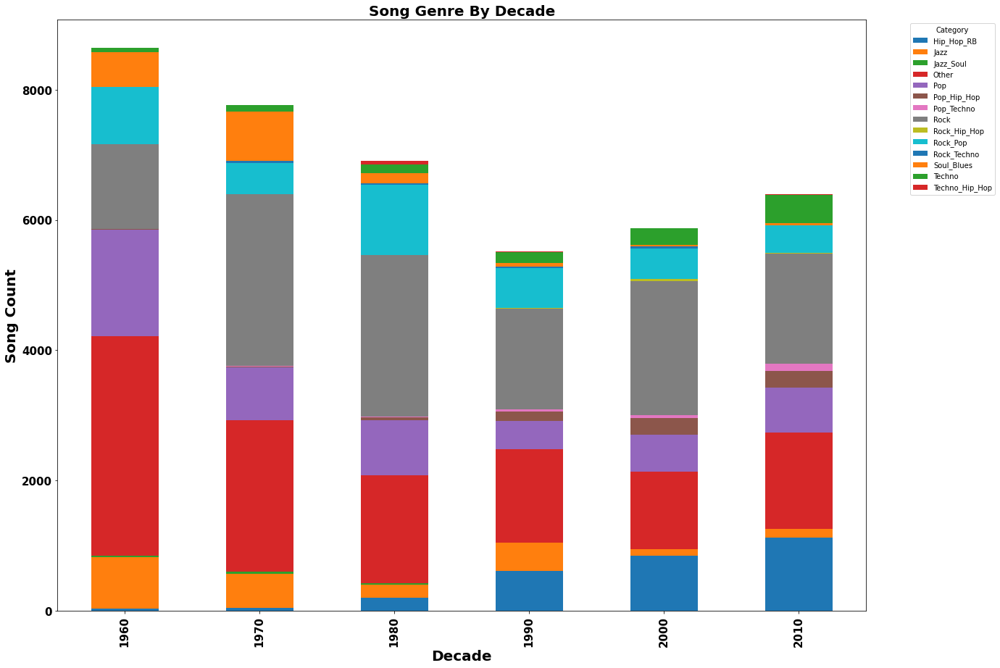

In [53]:
dfg = class_decade.groupby([class_decade.decade, 'genre_class'])['track'].sum().reset_index()
dfp = dfg.pivot(index='decade', columns='genre_class', values='track')
dfp.plot.bar(stacked=True, figsize=(20, 15))

plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Song Genre By Decade", fontsize=20, fontweight='bold')
plt.xlabel('Decade',fontsize=20, fontweight='bold')
plt.xticks(fontsize= 15, fontweight='bold')
plt.ylabel('Song Count',fontsize=20, fontweight='bold')
plt.yticks(fontsize= 15, fontweight='bold')

plt.show()


We can see again that we have more data from the 60s and 70s than we do from current data.

We also wee the reduction in jazz and soul & blues (both in orange) transitioning to more blue hip hop as we get out of the 60s and 70s and into the 90s and tens.

We also see our red genre, Other, decreasing through time while techno in green begins to fluctuate.  

Pop (purple), rock pop (cyan) and rock (grey) seem to move around depending on the decade oscialatting between categories. 

Let's take a look at what this looks like on a percentage basis.

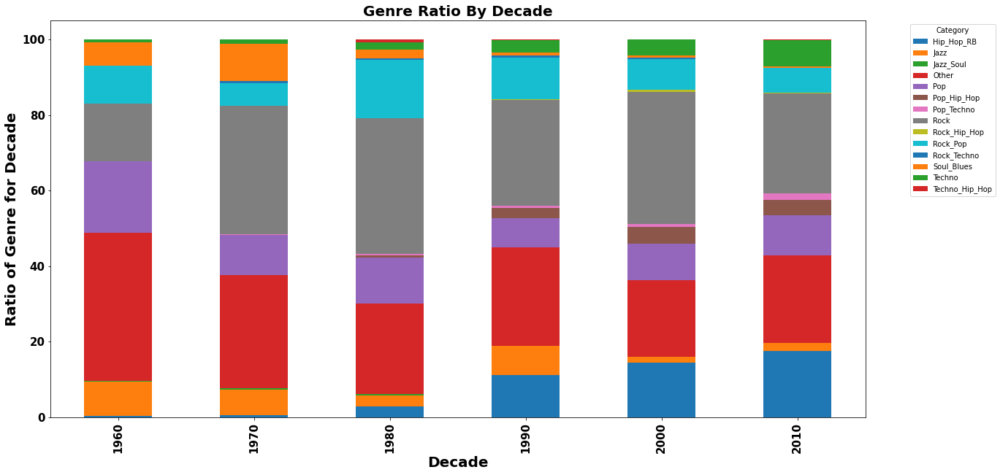

In [54]:
df2 = class_decade.pivot(index='decade', columns='genre_class', values='genre_ratio')
df2.plot.bar(stacked=True, figsize=(20, 10))
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('Decade',fontsize=20, fontweight='bold')
plt.title("Genre Ratio By Decade", fontsize=20, fontweight='bold')
plt.xticks(fontsize= 15, fontweight='bold')
plt.ylabel('Ratio of Genre for Decade',fontsize=20, fontweight='bold')
plt.yticks(fontsize= 15, fontweight='bold')
plt.show()

<AxesSubplot:xlabel='decade', ylabel='track'>

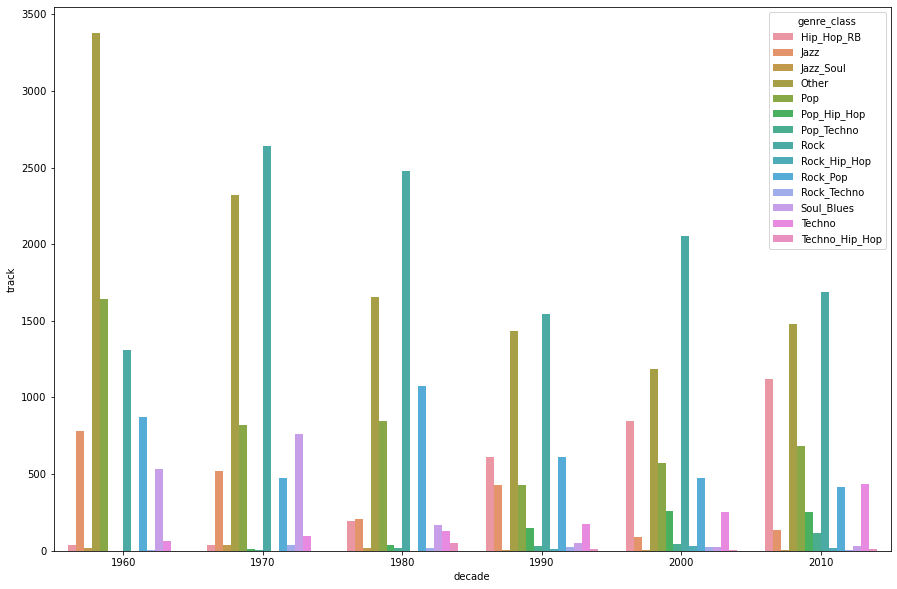

In [55]:
rcParams['figure.figsize'] = 15,10
sns.barplot(data=class_decade, y='track', x='decade', hue='genre_class')

We will keep the older databases around (60s through 80s) but for now let's look at the music that has defined the millenial and Gen Z generations first so we can try and predict a hit for this customer base that makes up about 60% of spotify's users

In [56]:
music.describe()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,decade,prev_hits,followers,popularity,hiphop,pop,rock,techno,jazz,soul_blues
count,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,41106.000000,...,41106.000000,41106.000000,3.920300e+04,39203.000000,39203.000000,39203.000000,39203.000000,39203.000000,39203.000000,39203.000000
mean,0.539695,0.579545,5.213594,-10.221525,0.693354,0.072960,0.364197,0.154416,0.201535,0.542440,...,1982.775264,2.971878,1.611930e+06,52.494426,0.165166,0.374538,0.586792,0.077469,0.205520,0.321838
std,0.177821,0.252628,3.534977,5.311626,0.461107,0.086112,0.338913,0.303530,0.172959,0.267329,...,17.491234,6.680466,5.443015e+06,19.944556,0.526904,0.556663,0.755968,0.387477,0.923605,1.029170
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,...,1960.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.420000,0.396000,2.000000,-12.816000,0.000000,0.033700,0.039400,0.000000,0.094000,0.330000,...,1970.000000,0.000000,2.188200e+04,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.552000,0.601000,5.000000,-9.257000,1.000000,0.043400,0.258000,0.000120,0.132000,0.558000,...,1980.000000,0.000000,1.473920e+05,54.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.669000,0.787000,8.000000,-6.374250,1.000000,0.069800,0.676000,0.061250,0.261000,0.768000,...,2000.000000,3.000000,8.144690e+05,67.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,1.000000,0.999000,0.996000,...,2010.000000,79.000000,7.890023e+07,100.000000,3.000000,2.000000,3.000000,6.000000,11.000000,9.000000


<Figure size 2880x2160 with 0 Axes>

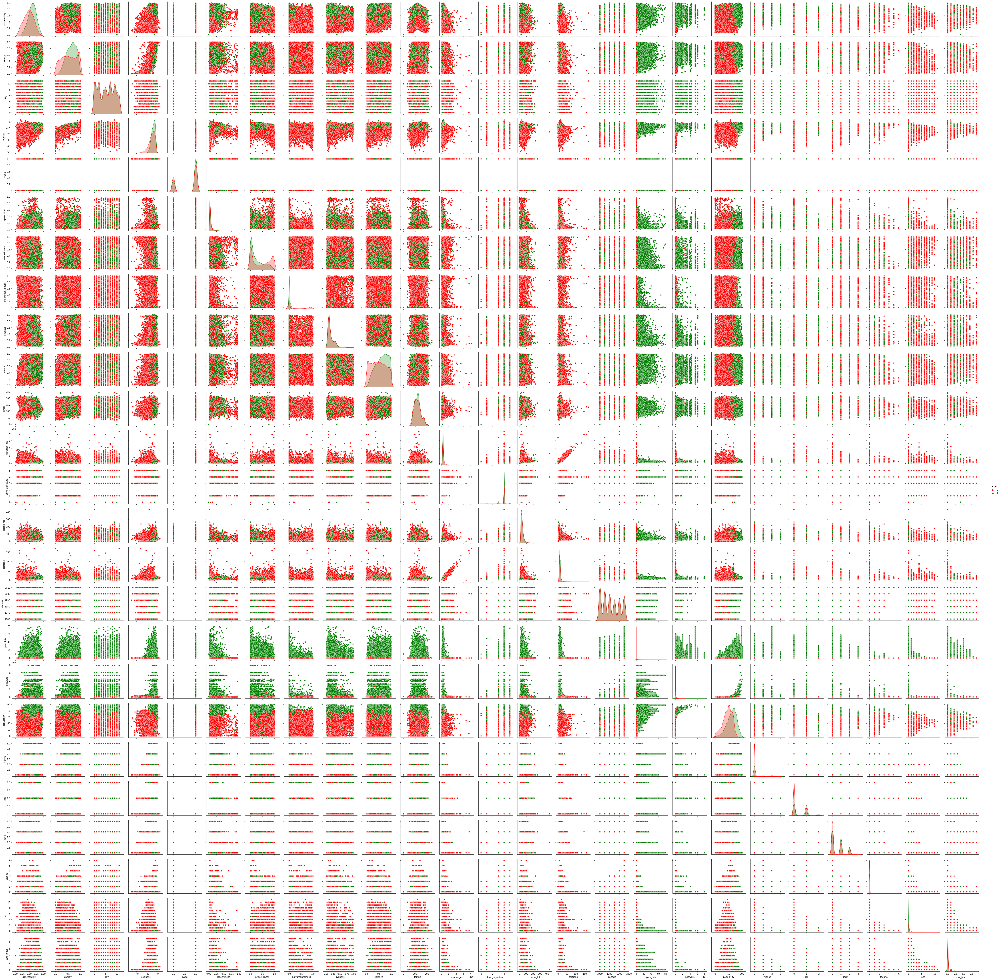

In [57]:
#Quick look at hits vs non hits and distributions across features
plt.figure(figsize=(40, 30))
sns.pairplot(music, hue='target',palette=('r','g'))

In [58]:
#danceability
hit_dance = music[music["target"] == 1]['danceability']
no_dance = music[music["target"] == 0]['danceability']

#energy
hit_energy = music[music["target"] == 1]['energy']
no_energy = music[music["target"] == 0]['energy']

#key
hit_key = music[music["target"] == 1]['key']
no_key = music[music["target"] == 0]['key']

#loudness
hit_loud = music[music["target"] == 1]['loudness']
no_loud = music[music["target"] == 0]['loudness']

#mode
hit_mode = music[music["target"] == 1]['mode']
no_mode = music[music["target"] == 0]['mode']

#speechiness
hit_speech = music[music["target"] == 1]['speechiness']
no_speech = music[music["target"] == 0]['speechiness']

#acoustiness
hit_acoustic= music[music["target"] == 1]['acousticness']
no_acoustic = music[music["target"] == 0]['acousticness']

#instrumentalness
hit_instr= music[music["target"] == 1]['instrumentalness']
no_instr= music[music["target"] == 0]['instrumentalness']

#liveness
hit_live= music[music["target"] == 1]['liveness']
no_live= music[music["target"] == 0]['liveness']

#valence
hit_val= music[music["target"] == 1]['valence']
no_val= music[music["target"] == 0]['valence']

#tempo
hit_tempo= music[music["target"] == 1]['tempo']
no_tempo= music[music["target"] == 0]['tempo']

#duration
hit_dur= music[music["target"] == 1]['duration_ms']
no_dur= music[music["target"] == 0]['duration_ms']

#time signature
hit_timesig= music[music["target"] == 1]['time_signature']
no_timesig= music[music["target"] == 0]['time_signature']

#chrous
hit_chorus= music[music["target"] == 1]['chorus_hit']
no_chorus = music[music["target"] == 0]['chorus_hit']

#sections
hit_section= music[music["target"] == 1]['sections']
no_section =  music[music["target"] == 0]['sections']

#previous hits
hit_prev= music[music["target"] == 1]['prev_hits']
no_prev = music[music["target"] == 0]['prev_hits']


<AxesSubplot:title={'center':'Previous Hits'}, xlabel='Previous Hits', ylabel='Count'>

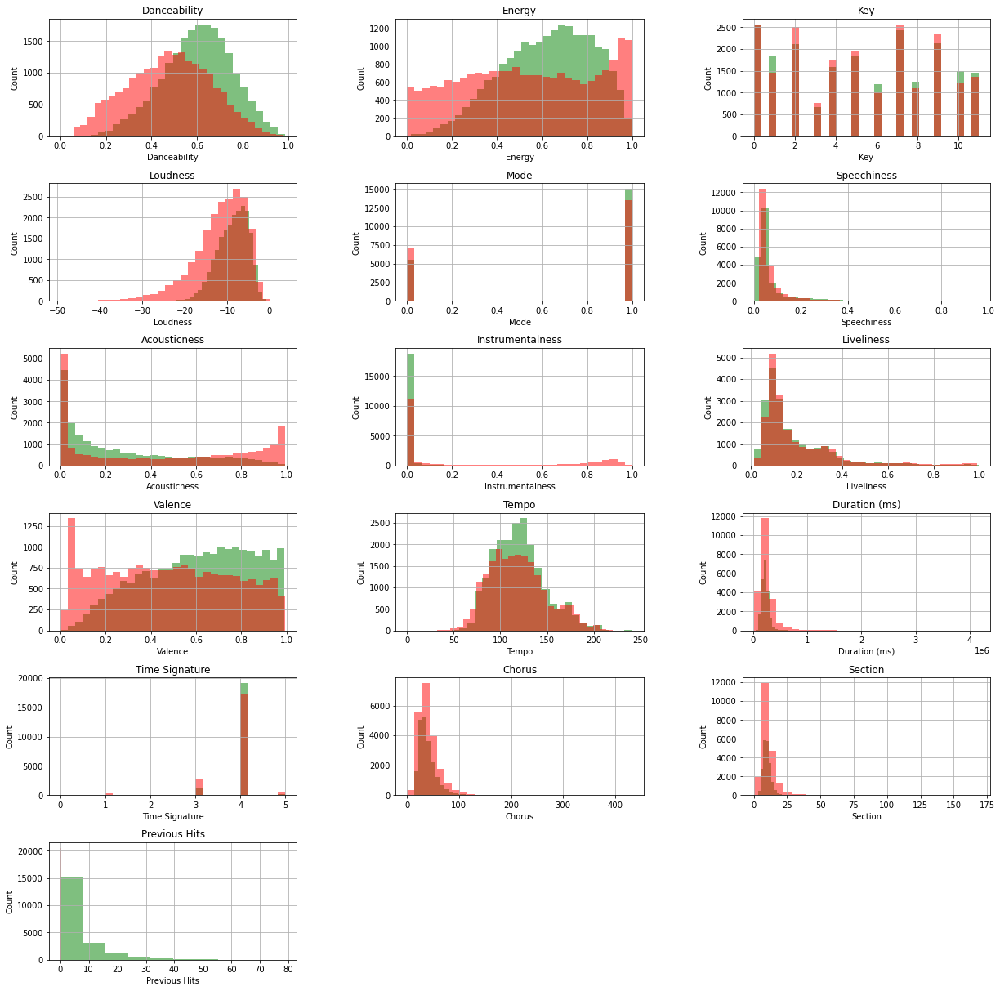

In [59]:
fig = plt.figure(figsize=(20,20))


import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
gs = gridspec.GridSpec(6, 3, figure=fig)


plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)

#Danceability
ax1 = fig.add_subplot(gs[0, 0])
ax1.set_xlabel('Danceability')
ax1.set_ylabel('Count')
ax1.set_title("Danceability")
hit_dance.hist(alpha = .5, bins=30, color = 'g')
no_dance.hist(alpha = .5, bins = 30, color = 'r')

#energy
ax2 = fig.add_subplot(gs[0, 1])
ax2.set_xlabel('Energy')
ax2.set_ylabel('Count')
ax2.set_title("Energy")
hit_energy.hist(alpha = .5, bins=30, color = 'g')
no_energy.hist(alpha = .5, bins = 30, color = 'r')

#key
ax3 = fig.add_subplot(gs[0, 2])
ax3.set_xlabel('Key')
ax3.set_ylabel('Count')
ax3.set_title("Key")
hit_key.hist(alpha = .5, bins=30, color = 'g')
no_key.hist(alpha = .5, bins = 30, color = 'r')

#loudness
ax4 = fig.add_subplot(gs[1, 0])
ax4.set_xlabel('Loudness')
ax4.set_ylabel('Count')
ax4.set_title("Loudness")
hit_loud.hist(alpha = .5, bins=30, color = 'g')
no_loud.hist(alpha = .5, bins = 30, color = 'r')

#mode
ax5 = fig.add_subplot(gs[1, 1])
ax5.set_xlabel('Mode')
ax5.set_ylabel('Count')
ax5.set_title("Mode")
hit_mode.hist(alpha = .5, bins=30, color = 'g')
no_mode.hist(alpha = .5, bins = 30, color = 'r')

#Speechiness
ax6 = fig.add_subplot(gs[1, 2])
ax6.set_xlabel('Speechiness')
ax6.set_ylabel('Count')
ax6.set_title("Speechiness")
hit_speech.hist(alpha = .5, bins=30, color = 'g')
no_speech.hist(alpha = .5, bins = 30, color = 'r')

#acoustic
ax7 = fig.add_subplot(gs[2, 0])
ax7.set_xlabel('Acousticness')
ax7.set_ylabel('Count')
ax7.set_title("Acousticness")
hit_acoustic.hist(alpha = .5, bins=30, color = 'g')
no_acoustic.hist(alpha = .5, bins = 30, color = 'r')

#instrumentalness
ax8 =fig.add_subplot(gs[2, 1])
ax8.set_xlabel('Instrumentalness')
ax8.set_ylabel('Count')
ax8.set_title("Instrumentalness")
hit_instr.hist(alpha = .5, bins=30, color = 'g')
no_instr.hist(alpha = .5, bins = 30, color = 'r')

#liveliness
ax9 = fig.add_subplot(gs[2, 2])
ax9.set_xlabel('Liveliness')
ax9.set_ylabel('Count')
ax9.set_title("Liveliness")
hit_live.hist(alpha = .5, bins=30, color = 'g')
no_live.hist(alpha = .5, bins = 30, color = 'r')


#valence
ax10 = fig.add_subplot(gs[3, 0])
ax10.set_xlabel('Valence')
ax10.set_ylabel('Count')
ax10.set_title("Valence")
hit_val.hist(alpha = .5, bins=30, color = 'g')
no_val.hist(alpha = .5, bins = 30, color = 'r')


#tempo
ax11 = fig.add_subplot(gs[3, 1])
ax11.set_xlabel('Tempo')
ax11.set_ylabel('Count')
ax11.set_title("Tempo")
hit_tempo.hist(alpha = .5, bins=30, color = 'g')
no_tempo.hist(alpha = .5, bins = 30, color = 'r')


#duration
ax12 = fig.add_subplot(gs[3, 2])
ax12.set_xlabel('Duration (ms)')
ax12.set_ylabel('Count')
ax12.set_title("Duration (ms)")
hit_dur.hist(alpha = .5, bins=30, color = 'g')
no_dur.hist(alpha = .5, bins = 30, color = 'r')


#time signature
ax13 = fig.add_subplot(gs[4, 0])
ax13.set_xlabel('Time Signature')
ax13.set_ylabel('Count')
ax13.set_title("Time Signature")
hit_timesig.hist(alpha = .5, bins=30, color = 'g')
no_timesig.hist(alpha = .5, bins = 30, color = 'r')


#chrous
ax14 = fig.add_subplot(gs[4, 1])
ax14.set_xlabel('Chorus')
ax14.set_ylabel('Count')
ax14.set_title("Chorus")
hit_chorus.hist(alpha = .5, bins=30, color = 'g')
no_chorus.hist(alpha = .5, bins = 30, color = 'r')


#sections
ax15 = fig.add_subplot(gs[4, 2])
ax15.set_xlabel('Section')
ax15.set_ylabel('Count')
ax15.set_title("Section")
hit_section.hist(alpha = .5, bins=30, color = 'g')
no_section.hist(alpha = .5, bins = 30, color = 'r')


#previous hits
ax17 = fig.add_subplot(gs[5, 0])
ax17.set_xlabel('Previous Hits')
ax17.set_ylabel('Count')
ax17.set_title("Previous Hits")
hit_prev.hist(alpha = .5, bins=10, color = 'g')
no_prev.hist(alpha = .5, bins = 10, color = 'r')



Uh oh.  Looks like the previous hits metric is gonna be a problem and is due to the way the data was collected.  For example Katy Perry's hits are all in this data set, but none of her flops.  And looking more closely at the documentation, one of the flop requirements reads as follows:

"The track's artist must not appear in the 'hit' list of that decade."

While artist can cross over decades, it seems the definition is a bit tight, may not be friendly to one hit wonders who then flop.  As part of the testing criteria it will be good to look at a particular artist album with some hits and flops and see how good our model can perform on them.

In terms of what stands out to me in looking at the features is danceability and energy. Both want to be higher on average for songs designated a hit while energy shouldn't be too high or too low.

Loudness also stands out a bit as it looks to be much less skewed towards quieter songs than the flops. And in relation to this we see lower number of hits that are high in acoustic ratings.

Lastly it does appear that Valence tends to be higher in hit songs. Songs that are more positive and make us feel good look to be better candidates for hits in this data set.

For the features we dragged in, not surprisingly popularity and followers are higher for hit songs, these would most likely be outcomes of musical or commercial success and therefore may not be helpful / honest in using music quality to predict outcomes. Previous Hits does seem to have a bit of green skewing right which fits a simple narrative of past success helping with future, but may raise similar issue that followers or popularity would have.

0    0.5
1    0.5
Name: target, dtype: float64


<AxesSubplot:>

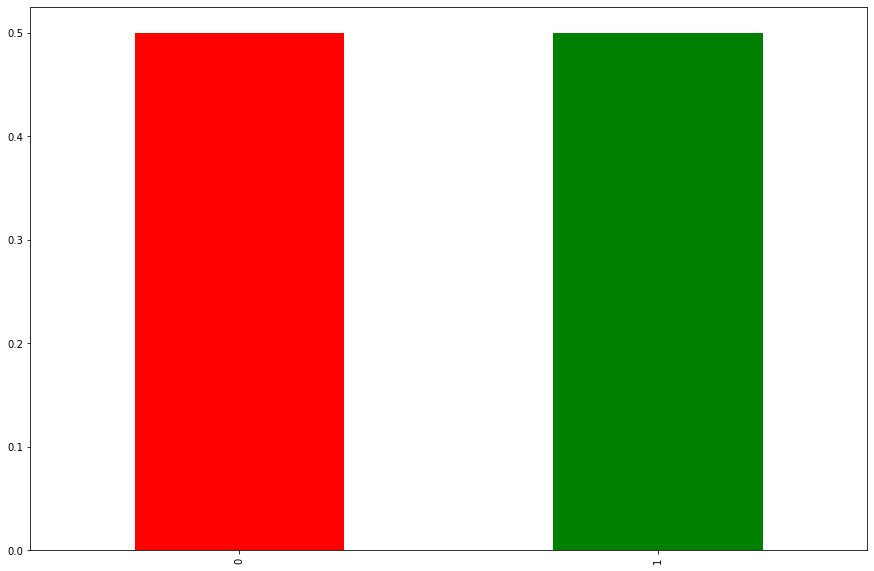

In [61]:
target_pcts = music.target.value_counts(normalize=True) 
print(target_pcts)

target_pcts.plot(kind='bar',color = ('r','g'))

Well this target distribution of 50-50 across the datasets is a concern.  Nearly half a million to a million songs are released within the US each year by fairly large artist.  Spotify reportedly adds 40,000 songs a day globally (although barriers to entry aren't high) but this distribution split is not very reflective of reality.

In any given year usually only around 600-700 songs make the top 100 in the US vs hundres of thousands of tracks.  We will have to keep this in mind as we move on and try to test this model outside of this data set.

In [62]:
#mill for millenial, in case we want to compare recent music to recent misic
all_df = [nineties,naughts,tens]
mill = pd.concat(all_df).reset_index(drop=True)

In [63]:
mill.to_pickle('mill.pickle')
tunes.to_pickle('tunes.pickle')

With most of the featuring engineering I can think of we move on to modeling.  We will try just the original data set through the various methods and then add our engineered features.